# Early stage ANN Model to predict HR
Purpose:
-  Building ANN (Artificial Neural Network) Model using 4 health metrics to predicit HR
- Using four Variables to predict one (Many to one)


Notes:
- Data was downsampled
- This model is based of the three variables model which is done by the Summer 2022 team 
- The Four-Variable ANN Model (All Variables) is the updated version of this model. 


# Loading and filtering the data

In [1]:
 # install external libraries

!pip install wfdb
!pip install tensorflow_addons
!pip install keras-tuner


In [2]:
# import libraries
import torch
import keras_tuner as kt
import matplotlib.pyplot as plt
import math
from mpl_toolkits import mplot3d
import numpy as np
import os
import pandas as pd
import seaborn as sns
import sklearn
from sklearn.model_selection import train_test_split
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import tensorflow as tf
import tensorflow_addons as tfa
import time
import wfdb
from wfdb import processing


In [4]:
#Need to allow code to access the CSV Dataset. 
#Setting up an environment variable. Will add a readme file in order to show how to use this method.


csv_folder_path = os.environ.get("CSV_Folder_Path")
case4_alldata_file_path = os.path.join(csv_folder_path, "uq_vsd_case04_alldata.csv")

# FILTERING THE DATA
df = pd.read_csv(case4_alldata_file_path, index_col=False, error_bad_lines=False, usecols=['Time', 'HR', 'SpO2', 'NBP (Mean)', 'ECG'])

df = df.dropna() #drop rows with NaN

case4_filteredData = df.loc[(~df['HR'].isnull()) & (~df['SpO2'].isnull()) & (~df['NBP (Mean)'].isnull()) & (~df['ECG'].isnull())]
case4_filteredData.drop('Time', axis=1, inplace=True)
print(case4_filteredData.head(10))
print(case4_filteredData.tail(10))
print(case4_filteredData.shape)

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\2189749267.py:9: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  df = pd.read_csv(file_path, index_col=False, error_bad_lines=False, usecols=['Time', 'HR', 'SpO2', 'NBP (Mean)', 'ECG'])


         HR  SpO2  NBP (Mean)    ECG
6758  112.0  97.0        93.0 -0.005
6759  112.0  97.0        93.0  0.040
6760  112.0  97.0        93.0  0.080
6761  112.0  97.0        93.0  0.115
6762  112.0  97.0        93.0  0.140
6763  112.0  97.0        93.0  0.140
6764  112.0  97.0        93.0  0.115
6765  112.0  97.0        93.0  0.055
6766  112.0  97.0        93.0  0.000
6767  112.0  97.0        93.0 -0.035
           HR   SpO2  NBP (Mean)    ECG
837315  131.0  100.0        98.0 -0.005
837316  131.0  100.0        98.0 -0.005
837317  131.0  100.0        98.0 -0.005
837318  131.0  100.0        98.0 -0.005
837319  131.0  100.0        98.0 -0.005
837320  131.0  100.0        98.0 -0.005
837321  131.0  100.0        98.0 -0.005
837322  131.0  100.0        98.0 -0.005
837323  131.0  100.0        98.0 -0.005
837324  131.0  100.0        98.0 -0.005
(785853, 4)


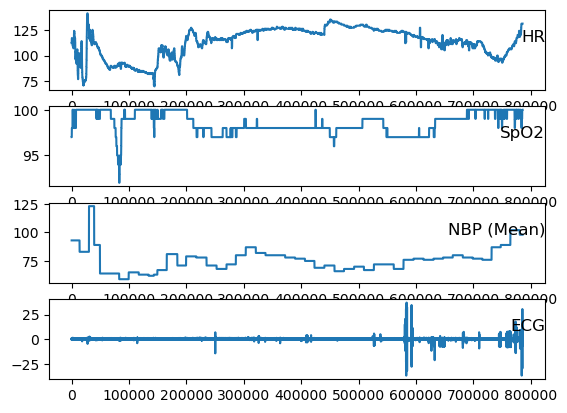

In [8]:
# plot data

new_data_file_path = os.path.join(csv_folder_path, "new_data.csv")

dataset = pd.read_csv(new_data_file_path, index_col=0, header=0)
values = dataset.values

# specify columns to plot
groups = [0,1,2,3]
i =1
for g in groups:
  plt.subplot(len(groups), 1, i)
  plt.plot(values[:, g])
  plt.title(dataset.columns[g], y=0.5, loc='right')
  i += 1
plt.show()

In [9]:
# ----------------------------------------------------------------- MANUALLY RESAMPLE -------------------------------------------------------------------
def downsample_data(window):
  df_temp = pd.DataFrame(columns=['HR', 'SpO2', 'NBP (Mean)', 'ECG'])
  HR_sum = 0
  SPO_sum = 0
  NBP_sum = 0
  ECG_sum = 0

  for i in range(1, len(values) - 1):
    HR_sum += values[i, 0]
    SPO_sum += values[i, 1]
    NBP_sum += values[i, 2]
    ECG_sum += values[i, 3]
    if (i + 1) % window == 0:
      HR_sum = HR_sum/window
      SPO_sum = SPO_sum/window
      NBP_sum = NBP_sum/window
      ECG_sum = ECG_sum/window
      row = {'HR':HR_sum, 'SpO2':SPO_sum, 'NBP (Mean)':NBP_sum, 'ECG':ECG_sum}
      df_temp = df_temp.append(row, ignore_index = True)
      HR_sum = 0
      SPO_sum = 0
      NBP_sum = 0
      ECG_sum = 0
  return df_temp

old_data = case4_filteredData
print('Size of old data:')
print(old_data.shape)

# downsampling data
case4_filteredData = downsample_data(15)

print('Size of new data:')
print(case4_filteredData.shape)

Size of old data:
(785853, 4)


C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_in

Size of new data:
(52390, 4)


C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\687391617.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_temp = df_temp.append(row, ignore_index = True)


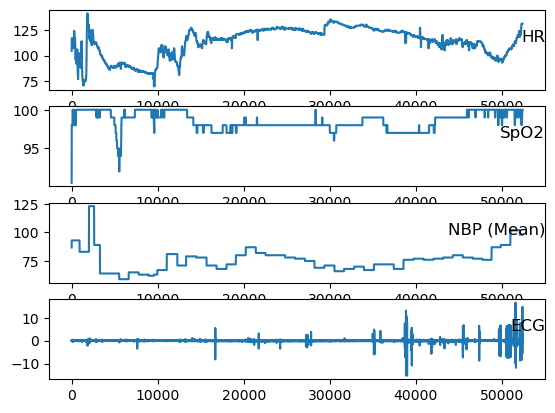

In [10]:
# plot data
dataset = case4_filteredData # use if google drive
values = dataset.values

# specify columns to plot
groups = [0,1,2,3]
i =1
for g in groups:
  plt.subplot(len(groups), 1, i)
  plt.plot(values[:, g])
  plt.title(dataset.columns[g], y=0.5, loc='right')
  i += 1
# plt.show()

# Pre-processing - Combining Data, Scaling, Splitting Up Data

In [12]:
# Function for splitting data into training and test set non-randomly

# This is from the 3 variables model 

"""
This functions splits the data into training and test sets.

@param data_df : a Pandas Dataframe that contains the data to be split into training and test sets
@param train_size : a double/float that is within the range of 0 and 1 and represents the fraction of the data to be used for the training set

@returns two Numpy arrays that represent the training and test sets, respectively
"""
def split_data_train_test(data_df, train_size):
  train_df, test_df = data_df[0:round(train_size * len(data_df)), :], data_df[round(train_size * len(data_df)):len(data_df), :]

  return train_df, test_df

# Function for scaling the data
"""
This function takes in the data to be scaled and uses Min-Max Scaling.

@param data : a Numpy array that represents the inputted data to be scaled

@returns the scaled data as a Numpy array, the MinMax scaler object, the scaling factor used, and the minimum value of the original inputted data
"""
def minMaxScaling(data):
  scaler = sklearn.preprocessing.MinMaxScaler(feature_range=(0.1, 1))
  scaler.fit(data)

  scaleFactor = scaler.scale_
  data_min = scaler.data_min_
  data_max = scaler.data_max_
  data = scaler.transform(data)

  return data, scaler, scaleFactor, data_min, data_max

"""
This function takes in the data to be scaled and uses Standard Scaling.

@param data : a Numpy array that represents the inputted data to be scaled

@returns the scaled data as a Numpy array, the Standard scaler object, the mean of the original inputted data, and the standard deviation of the original inputted data
"""
def stdScaling(data):
  scaler = sklearn.preprocessing.StandardScaler()
  scaler.fit(data)

  mean = scaler.mean_
  std_dev = scaler.var_ ** 0.5
  data = scaler.transform(data)

  return data, scaler, mean, std_dev

"""
This function plots the inputted data in a 2D scatterplot.

@param xvals : a 1D Numpy array that contains the data to be plotted on the x-axis
@param data : a 1D Numpy array that contains the data to be plotted on the y-axis
@param xVariable : a string that represents the label of the data to be plotted for x-axis
@param yVariable : a string that represents the label of the data to be plotted for y-axis
"""
def plot_data(xvals, data, xVariable, yVariable):
  plt.figure(figsize=(10, 5))
  plt.scatter(xvals, data)
  plt.title("Plot of Data for " + yVariable + ", " + xVariable)
  plt.ylabel(yVariable)
  plt.xlabel(xVariable)
  plt.show()

In [14]:
# Scaling and splitting dataset, using R-Wave Voltages and SpO2 as features
pd.options.display.max_rows = 1000
print(case4_filteredData.head(20))


case4_filteredData_arr_scaled, minMaxScaler, minMaxScaleFactor, case4_filteredData_min, case4_filteredData_max = minMaxScaling(case4_filteredData)
# combinedData_arr_scaled, stdScaler, combinedData_mean, combinedData_stdDev = stdScaling(combinedData_df) # uncomment this if standard scaling will be used

# Add more columns names if more health variables are added.
case4_filteredData_scaled = pd.DataFrame(case4_filteredData_arr_scaled, columns=["HR", "SpO2","NBP","ECG"])

print()
print(case4_filteredData_scaled[0:20])

listOfVariables = ["HR", "SpO2","NBP","ECG"] # Add more columns names if more health variables are added.
listOfVariables_len = len(listOfVariables) - 1 

data_train, data_test = split_data_train_test(np.array(case4_filteredData_scaled[listOfVariables]), train_size=0.8) # scaled data
# data_train, data_test = split_data_train_test(np.array(combinedData_df[listOfVariables]), train_size=0.8) # non-scaled

print("\nOriginal data train and test: ")
print(data_train[0:20])

# print(" Original test")
print(data_test[0:20])


print(" Here to see the size of each data: ")
print("This is the size of the train data: ")
print(data_train.shape)
print("This is the size of the test data: ")
print(data_test.shape)

            HR       SpO2  NBP (Mean)       ECG
0   104.533333  90.533333        86.8  0.013333
1   112.000000  97.000000        93.0 -0.021333
2   112.000000  97.000000        93.0  0.071000
3   112.000000  97.000000        93.0  0.014667
4   112.000000  97.000000        93.0 -0.050333
5   112.000000  97.000000        93.0  0.083333
6   112.266667  97.000000        93.0 -0.204333
7   114.000000  97.000000        93.0 -0.159000
8   114.000000  97.000000        93.0 -0.192000
9   114.000000  97.000000        93.0 -0.077333
10  114.000000  97.000000        93.0 -0.103333
11  114.000000  97.000000        93.0 -0.096333
12  114.000000  97.000000        93.0  0.129000
13  114.333333  97.333333        93.0 -0.058000
14  115.000000  98.000000        93.0  0.198000
15  115.000000  98.000000        93.0  0.166333
16  115.000000  98.000000        93.0  0.231667
17  115.000000  98.000000        93.0  0.188667
18  115.000000  98.000000        93.0  0.103333
19  115.000000  98.000000        93.0  0

In [15]:
# Splitting data into previous values and next values
# From the 3 variables model.
"""
This function splits the training and test sets and turns a certain number of previous values as "features" and the next value as the "target"

@param train_array : a Numpy array with at least 2 columns of the training set values
@param test_array : a Numpy array with at least 2 columns of the test set values
@param numOfPrevValues : an integer that represents the number of previous rows of values to use as features
@param targetIndex : an integer that represents the column number to use for target values

@returns four Numpy arrays for the previous values in the training set, the next 1 value in the training set, the previous values
         in the test set, and the next 1 value in the test set
"""
def splitDataToFeaturesTargetValues(train_array, test_array, numOfPrevValues=27, targetIndex=1):

  prevData_train = []
  nextData_train = [] 
  prevData_test = []
  nextData_test = []

  for i in range(numOfPrevValues, len(train_array)):
    prevData_train.append(train_array[i-numOfPrevValues: i])
    nextData_train.append(train_array[i][targetIndex])

  for j in range(numOfPrevValues, len(test_array)):
    prevData_test.append(test_array[j-numOfPrevValues: j])
    nextData_test.append(test_array[j][targetIndex])
  
  prevData_train = np.array(prevData_train)
  nextData_train = np.array(nextData_train).reshape(len(nextData_train), 1)
  prevData_test = np.array(prevData_test)
  nextData_test = np.array(nextData_test).reshape(len(nextData_test), 1)

  return prevData_train, nextData_train, prevData_test, nextData_test

data_train_features, data_train_label, data_test_features, data_test_label = splitDataToFeaturesTargetValues(data_train, data_test, numOfPrevValues=50, targetIndex=1)
print("This is the data_train_features")
print(data_train_features[0:10])
print("This is the data_train_label")
print(data_train_label[0:10])
print("This is the data_test_features")
print(data_test_features[0:10])
print("This is the data_test_label")
print(data_test_label[0:10])

This is the data_train_features
[[[0.53774648 0.1        0.4909375  0.53099888]
  [0.63239437 0.71478873 0.578125   0.53002182]
  [0.63239437 0.71478873 0.578125   0.53262419]
  ...
  [0.68056338 0.80985915 0.578125   0.52473251]
  [0.67042254 0.80985915 0.578125   0.52826498]
  [0.67042254 0.80985915 0.578125   0.52753218]]

 [[0.63239437 0.71478873 0.578125   0.53002182]
  [0.63239437 0.71478873 0.578125   0.53262419]
  [0.63239437 0.71478873 0.578125   0.53103646]
  ...
  [0.67042254 0.80985915 0.578125   0.52826498]
  [0.67042254 0.80985915 0.578125   0.52753218]
  [0.67042254 0.80985915 0.578125   0.52660209]]

 [[0.63239437 0.71478873 0.578125   0.53262419]
  [0.63239437 0.71478873 0.578125   0.53103646]
  [0.63239437 0.71478873 0.578125   0.52920446]
  ...
  [0.67042254 0.80985915 0.578125   0.52753218]
  [0.67042254 0.80985915 0.578125   0.52660209]
  [0.67042254 0.80985915 0.578125   0.52976816]]

 ...

 [[0.65774648 0.71478873 0.578125   0.52614174]
  [0.65774648 0.71478873 0

###General Functions for Machine Learning Models


In [16]:
# Function that makes the loss function plots and linear regression model
# From the 3 Variables Model "Mostly not needed"

"""
This function plots a loss function based on the output of the model fitting.

@param loss_vals : a Tensorflow History object from model fitting, which is used to get the training and validation loss values
@param startRange : an integer that is >= 0, is within the indices of loss_vals, and represents the start indices of the loss values to plot
@param endRange : an integer that is <= len(loss_vals) - 1, is larger than startRange, and represents the end indices of the loss values to plot
"""
def plot_loss(loss_vals, startRange, endRange):
  plt.figure(figsize=(12, 8))
  plt.plot(loss_vals.history['loss'][startRange:endRange], label="Training Loss") 
  plt.plot(loss_vals.history['val_loss'][startRange:endRange], label="Validation Loss") 
  plt.xlabel("Epoch")
  plt.ylabel("Error")
  plt.title("Learning Curve")
  plt.legend()

"""
This function plots the inputted actual and predicted data in a 2D scatterplot.

@param xvals : a 1D Numpy array that contains the data to be plotted on the x-axis
@param actual_data : a 1D Numpy array that contains the actual data to be plotted on the y-axis
@param predicted_data : a 1D Numpy array that contains the predicted data to be plotted on the y-axis
@param xName : a string that represents the x-values and label for the x-axis
@param yName : a string that represents the y-values and label for the y-axis
"""
def plot_model_data(xvals, actual_data, predicted_data, xName, yName):
  plt.figure(figsize=(12, 8))
  plt.scatter(xvals, actual_data, label="Actual Data", color="r")
  plt.plot(xvals, predicted_data, label="Predicted Data", color="black")
  plt.title("Plot of Model Data for " + xName + " Against " + yName)
  plt.xlabel(xName)
  plt.ylabel(yName)
  plt.legend()

"""
This function plots the inputted actual and predicted data in a 3D scatterplot.

@param x_val : a 1D Numpy array that contains the data to be plotted on the x-axis
@param y_val : a 1D Numpy array that contains the data to be plotted on the y-axis
@param actual_data : a 1D Numpy array that contains the actual data to be plotted on the z-axis
@param predicted_data : a 1D Numpy array that contains the predicted data to be plotted on the z-axis
@param xName : a string that represents the x-values and label for the x-axis
@param yName : a string that represents the y-values and label for the y-axis
@param zName : a string that represents the z-values and label for the z-axis
"""
def plot_model_data3D(x_val, y_val, actual_data, predicted_data, xName, yName, zName):
  fig = plt.figure(figsize=(12, 8))

  ax = plt.axes(projection='3d')
  ax.scatter3D(x_val, y_val, actual_data, label='Actual Data', color="red")
  ax.plot3D(x_val, y_val, predicted_data, label='Predicted Data', color="black")

  ax.set_title("Plot of Model Data for " + xName + " And " + yName + " Against " + zName, pad=20)
  ax.set_xlabel(xName)
  ax.set_ylabel(yName)
  ax.set_zlabel(zName)
  ax.legend()


In [17]:
# Functions for getting metrics and plotting predictions
# From the 3 variables model

"""
This functions gets and prints the root mean squared error (RMSE) of the targets.

@param test_targets : a Numpy array that represents the actual target values
@param predicted_targets : a Numpy array that represents the predicted target values

@returns the RMSE double/float value
"""
def get_and_print_rmse_for_model(test_targets, predicted_targets):
  rmseMetric = tf.keras.metrics.RootMeanSquaredError()
  rmseMetric.update_state([test_targets], [predicted_targets])
  rmseMetricResult = rmseMetric.result().numpy()

  print("RMSE: " + str(rmseMetricResult))
  return rmseMetricResult

"""
This functions gets and prints the coefficient of determination (R^2) of the targets.

@param test_targets : a Numpy array that represents the actual target values
@param predicted_targets : a Numpy array that represents the predicted target values

@returns the R^2 double/float value
"""
def get_and_print_R2_for_model(test_targets, predicted_targets):
  r2 = sklearn.metrics.r2_score(y_true=test_targets, y_pred=predicted_targets)
  print("R2 (Sklearn): " + str(r2))
  
  return r2

"""
This function uses the mean absolute percentage error (MAPE) to get a percentage error for a regression model. 

Note that if the output is a number above 1 or below 0, usually very big in magnitude, it is because 
some of the numbers in the test_targets are 0 or very close to 0, which gives a division by 0.

@param test_targets : a Numpy array that represents the actual target values
@param predicted_targets : a Numpy array that represents the predicted target values

@returns the MAPE double/float value which represents the decimal form of the percentage, so generally between 0 and 1
"""
def get_and_print_mape_for_model(test_targets, predicted_targets):
  mape = sklearn.metrics.mean_absolute_percentage_error(test_targets, predicted_targets)
  print("MAPE: " + str(mape))

  return mape

"""
This function gets the mean absolute error (MAE) for a regression model. 

Note that if the output is a number below 0, usually very big in magnitude, it is because 
some of the numbers in the test_targets are 0 or very close to 0, which gives a division by 0.

@param test_targets : a Numpy array that represents the actual target values
@param predicted_targets : a Numpy array that represents the predicted target values

@returns the MAPE double/float value, which should be greater than or equal to 0
"""
def get_and_print_mae_for_model(test_targets, predicted_targets):
  mae = sklearn.metrics.mean_absolute_error(test_targets, predicted_targets)
  print("MAE: " + str(mae))

  return mae

"""
This functions plots the actual and predicted values as a line plot.

@param indices : the x-values of the plot as a 1-column Numpy array
@param test_targets : a 1-column Numpy array that represents the actual target values
@param predicted_targets : a 1-column Numpy array that represents the predicted target values
"""
def plot_actual_and_predictions_line(x_val, test_targets, predicted_targets):
  fig = plt.figure(figsize=(12, 8))
  plt.plot(x_val, test_targets, label="Actual Values", c="b")
  plt.plot(x_val, predicted_targets, label="Predicted Values", c="r")

  plt.ylabel("Values")
  plt.title("Plot of Actual and Predicted Values")
  plt.legend()

"""
This functions plots the actual and predicted values as a scatter plot.

@param indices : a 1-column Numpy array that represents x-values of the plot 
@param test_targets : a 1-column Numpy array that represents the actual target values
@param predicted_targets : a 1-column Numpy array that represents the predicted target values
"""
def plot_actual_and_predictions_scatter(x_val, test_targets, predicted_targets):
  fig = plt.figure(figsize=(12, 8))
  plt.scatter(x_val, test_targets, label="Actual Values", c="b")
  plt.scatter(x_val, predicted_targets, label="Predicted Values", c="r")

  plt.ylabel("Value")
  plt.title("Plot of Actual and Predicted Values")
  plt.legend()

In [18]:
# Functions for making artificial neural networks with a different amount of layers
# From the 3 variables model
"""
This function makes a custom artificial neural network model.

@param train_features : a Numpy array that represents the training data features
@param train_labels : a Numpy array that represents the training data targets
@param numOfUnits : a list that contains the number of units for each layer, which could be customized by providing different integers in the desired order. 
                    The size of the list should either be equal to 1 or numOfLayers. If size = 1, then all layers will have that number of units in the list.
                    (eg. [4, 8, 16] if numOfLayers = 3, or [4] for any value of numOfLayers)
@param numOfLayers : an integer that represents the desired of layers to add to the model 
@param epochNum : the number of iterations/epochs for running the model
@param learning_rate : a double/float that represents the learning rate of the model

@returns the artificial neural network TensorFlow model and the result from fitting the model

"""
def make_custom_ANN(train_features, train_labels, numOfUnits=[4], numOfLayers=3, batchNum=None, epochNum=100, learning_rate=0.01, min_delta=0.0007):
  callback_valLoss = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=1, min_delta=min_delta, mode='min', verbose=1)
  callback_trainLoss = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=1, min_delta=min_delta, mode='min', verbose=1)

  ann_model = tf.keras.Sequential()
  limit = numOfLayers

  if (len(numOfUnits) is not numOfLayers) and (len(numOfUnits) is not 1):
    raise Exception("Invalid input for numOfUnits.")

  ann_model.add(tf.keras.layers.Normalization(axis=-1))
  
  for i in range(0, limit):
    if len(numOfUnits) is numOfLayers:
      numUnits = numOfUnits[i]
    
    else:
      numUnits = numOfUnits[0]

    ann_model.add(tf.keras.layers.Dense(units=numUnits, activation="relu"))
  
  ann_model.add(tf.keras.layers.Dense(1)) # for 1 value output
  ann_model.compile(optimizer=tf.optimizers.Adam(learning_rate=learning_rate),
                    loss='mean_squared_error', metrics=['accuracy'])
  
  ann_model_fit = ann_model.fit(train_features, train_labels, batch_size=batchNum, epochs=epochNum, validation_split=0.3, callbacks=[callback_valLoss, callback_trainLoss])
  

  return ann_model, ann_model_fit

<>:25: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:25: SyntaxWarning: "is not" with a literal. Did you mean "!="?
C:\Users\vithu\AppData\Local\Temp\ipykernel_16040\2417578831.py:25: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if (len(numOfUnits) is not numOfLayers) and (len(numOfUnits) is not 1):


###Artificial Neural Network for Using 1 Variable for Predicting the Same Variable Using the Previous Value As a Target- Dump Model

In [19]:
# Here we can start building this model first then we move forward with 4 variables models
# Restructuring the data such that the target/label is the previous value
listOfVariables = ["HR"] # Change this to use a different health variable
listOfVariables_len = len(listOfVariables) - 1

data_train, data_test = split_data_train_test(np.array(case4_filteredData_scaled[listOfVariables]), train_size=0.8) # scaled
# data_train, data_test = split_data_train_test(np.array(combinedData_df[listOfVariables]), train_size=0.8) # non-scaled

print("\nOriginal data train and test: ")
print(data_train[0:20])
print(data_test[0:20])

data_train_features = []
data_train_label = []
data_test_features = []
data_test_label = []

for i in range(1, len(data_train)):
  data_train_features.append(data_train[i])
  data_train_label.append(data_train[i - 1])

for j in range(1, len(data_test)):
  data_test_features.append(data_test[j])
  data_test_label.append(data_test[j - 1])

data_train_features = np.array(data_train_features).reshape(len(data_train_features), 1)
data_train_label = np.array(data_train_label).reshape(len(data_train_label), 1)
data_test_features = np.array(data_test_features).reshape(len(data_test_features), 1)
data_test_label = np.array(data_test_label).reshape(len(data_test_label), 1)

print(data_train_features[0:20]), print(data_train_label[0:20]), print(data_test_features[0:20]), print(data_test_label[0:20])


Original data train and test: 
[[0.53774648]
 [0.63239437]
 [0.63239437]
 [0.63239437]
 [0.63239437]
 [0.63239437]
 [0.63577465]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.66197183]
 [0.67042254]
 [0.67042254]
 [0.67042254]
 [0.67042254]
 [0.67042254]
 [0.67042254]]
[[0.65774648]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.65605634]
 [0.64507042]
 [0.64507042]
 [0.64507042]
 [0.64507042]
 [0.64507042]
 [0.64507042]
 [0.64507042]]
[[0.63239437]
 [0.63239437]
 [0.63239437]
 [0.63239437]
 [0.63239437]
 [0.63577465]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.65774648]
 [0.66197183]
 [0.67042254]
 [0.67042254]
 [0.67042254]
 [0.67042254]
 [0.67042254]
 [0.67042254]
 [0.67633803]]
[[0.53774648]
 [0.63239437]
 [0.63239437]
 [0.63239437]
 [0.63239437]
 [0.63239437]
 [0.63577465]
 [0.65774648]
 [0.65774648]

(None, None, None, None)

In [20]:
# Running the model- artificial neural network

# batch_num = int(len(data_train_label) / 50)
batch_num = None
epochNum = 5000
learn_rate = 0.000001
numOfUnits_list = [512]
ann_model, ann_model_fit = make_custom_ANN(data_train_features, data_train_label, numOfUnits=numOfUnits_list, batchNum=batch_num,
                                           numOfLayers=3, epochNum=epochNum, learning_rate=learn_rate, min_delta=0.0001)

plot_loss(ann_model_fit, 0, epochNum)
ann_model.summary()

Epoch 1/5000
917/917 [==============================] - 16s 15ms/step - loss: 0.3083 - accuracy: 0.0000e+00 - val_loss: 0.3458 - val_accuracy: 0.0000e+00
Epoch 2/5000
917/917 [==============================] - 13s 14ms/step - loss: 0.1424 - accuracy: 6.8173e-05 - val_loss: 0.1342 - val_accuracy: 0.0000e+00
Epoch 3/5000
917/917 [==============================] - 13s 14ms/step - loss: 0.0427 - accuracy: 9.2034e-04 - val_loss: 0.0296 - val_accuracy: 0.0000e+00
Epoch 4/5000
917/917 [==============================] - 14s 16ms/step - loss: 0.0064 - accuracy: 9.2034e-04 - val_loss: 0.0031 - val_accuracy: 0.0000e+00
Epoch 5/5000
100/917 [==>...........................] - ETA: 9s - loss: 0.0015 - accuracy: 0.0022

KeyboardInterrupt: 

In [ ]:
print(data_train_features.shape)

In [ ]:
# Predicting with the model - training set - ANN

print("\nFor training set:\n")
predictions = ann_model.predict(data_train_features)

predictions = predictions.reshape(data_train_features.shape[0], data_train_features.shape[1]) # current shape is (length, numOfPrevValues, 1)
predictions = predictions[:, 0] # getting values for the next time step (t) and not (t+1, t+2, or t+3)
predictions = np.reshape(predictions, newshape=(len(predictions), 1))
# predictions[predictions > 1.0] = 1.0

get_and_print_rmse_for_model(data_train_label, predictions)
get_and_print_R2_for_model(data_train_label, predictions)
get_and_print_mae_for_model(data_train_label, predictions)
get_and_print_mape_for_model(data_train_label, predictions)

print("\nAfter reversing the scaling:\n")

# For when MinMaxScaler was used; change the column number/index to get the values for other health variables
predictions_reversed = ((predictions - 0.1) / (1 - 0.1)) * (case4_filteredData_max[1] - case4_filteredData_min[1]) + case4_filteredData_min[1]
data_train_label_reversed = ((data_train_label - 0.1) / (1 - 0.1)) * (case4_filteredData_max[1] - case4_filteredData_min[1]) + case4_filteredData_min[1]
data_train_features_reversed = ((data_train_features - 0.1) / (1 - 0.1)) * (case4_filteredData_max[1] - case4_filteredData_min[1]) + case4_filteredData_min[1]
# predictions_reversed[predictions_reversed > 100] = 100

# For when standard scaling was used; change the column number/index to get the values for other health variables
# predictions_reversed = predictions * combinedData_stdDev[2] + combinedData_mean[2]
# data_test_label_reversed = data_test_label * combinedData_stdDev[2] + combinedData_mean[2]
# data_test_features_reversed = data_test_features * combinedData_stdDev[0] + combinedData_mean[0]

get_and_print_rmse_for_model(data_train_label_reversed, predictions_reversed)
get_and_print_R2_for_model(data_train_label_reversed, predictions_reversed)
get_and_print_mae_for_model(data_train_label_reversed, predictions_reversed)
get_and_print_mape_for_model(data_train_label_reversed, predictions_reversed)

plot_actual_and_predictions_line(np.arange(0, len(data_train_label)), data_train_label, predictions)
plot_actual_and_predictions_scatter(np.arange(0, len(data_train_label)), data_train_label, predictions)

In [ ]:
# Predicting with the model - test set - ANN

print("\nFor testing set:\n")
predictions = ann_model.predict(data_test_features)

predictions = predictions.reshape(data_test_features.shape[0], data_test_features.shape[1]) # current shape is (length, numOfPrevValues, 1)
predictions = predictions[:, 0] # getting values for the next time step (t) and not (t+1, t+2, or t+3)
predictions = np.reshape(predictions, newshape=(len(predictions), 1))
# predictions[predictions > 1.0] = 1.0

get_and_print_rmse_for_model(data_test_label, predictions)
get_and_print_R2_for_model(data_test_label, predictions)
get_and_print_mae_for_model(data_test_label, predictions)
get_and_print_mape_for_model(data_test_label, predictions)

# column 2 for SpO2 values, 0 for ECG R-Wave Voltages; change the column number/index to get the values for other health variables
print("\nAfter reversing the scaling: \n")

# For when MinMaxScaler was used
predictions_reversed = ((predictions - 0.1) / (1 - 0.1)) * (case4_filteredData_max[1] - case4_filteredData_min[1]) + case4_filteredData_min[1]
data_test_label_reversed = ((data_test_label - 0.1) / (1 - 0.1)) * (case4_filteredData_max[1] - case4_filteredData_min[1]) + case4_filteredData_min[1]
data_test_features_reversed = ((data_test_features - 0.1) / (1 - 0.1)) * (case4_filteredData_max[1] - case4_filteredData_min[1]) + case4_filteredData_min[1]
# predictions_reversed[predictions_reversed > 100] = 100

# For when standard scaling was used; change the column number/index to get the values for other health variables
# predictions_reversed = predictions * combinedData_stdDev[2] + combinedData_mean[2]
# data_test_label_reversed = data_test_label * combinedData_stdDev[2] + combinedData_mean[2]
# data_test_features_reversed = data_test_features * combinedData_stdDev[0] + combinedData_mean[0]

get_and_print_rmse_for_model(data_test_label_reversed, predictions_reversed)
get_and_print_R2_for_model(data_test_label_reversed, predictions_reversed)
get_and_print_mae_for_model(data_test_label_reversed, predictions_reversed)
get_and_print_mape_for_model(data_test_label_reversed, predictions_reversed)

print("\nRange of Values: " + str(case4_filteredData_min[2]) + " to " + str(case4_filteredData_max[2]) + "\n")

plot_actual_and_predictions_line(np.arange(0, len(data_test_label)), data_test_label, predictions)
plot_actual_and_predictions_scatter(np.arange(0, len(data_test_label)), data_test_label, predictions)

plot_model_data(data_test_features, data_test_label, predictions, "HR", "HR")

###Artificial Neural Network Model for Using HR, SpO2, NBP (Mean), ECG to Predict HR

In [ ]:
# Running the model for HR - artificial neural network

data_train_features, data_train_label, data_test_features, data_test_label = splitDataToFeaturesTargetValues(data_train, data_test, numOfPrevValues=27, targetIndex=0)

# batch_num = int(len(data_train_label) / 1350)
batch_num = None
epochNum = 5000
learn_rate = 0.000001
numOfUnits_list = [512]
print("SAJDAS")



ann_model_hr, ann_model_hr_fit = make_custom_ANN(data_train_features, data_train_label, numOfUnits=numOfUnits_list, batchNum=batch_num,
                                           numOfLayers=3, epochNum=epochNum, learning_rate=learn_rate, min_delta=0.0001)

plot_loss(ann_model_hr_fit, 0, epochNum)
ann_model_hr.summary()

In [ ]:
print(data_train_features.shape)

In [ ]:
# Predicting with the model for HR - training set - ANN

print("\nFor training set:\n")
predictions = ann_model_hr.predict(data_train_features)

predictions = predictions.reshape(data_train_features.shape[0], data_train_features.shape[1]) # current shape is (length, numOfPrevValues, 1)
predictions = predictions[:, 0] # getting values for the next time step (t) and not (t+1, t+2, or t+3)
predictions = np.reshape(predictions, newshape=(len(predictions), 1))

get_and_print_rmse_for_model(data_train_label, predictions)
get_and_print_R2_for_model(data_train_label, predictions)
get_and_print_mae_for_model(data_train_label, predictions)
get_and_print_mape_for_model(data_train_label, predictions)

plot_actual_and_predictions_line(np.arange(0, len(data_train_label)), data_train_label, predictions)
plot_actual_and_predictions_scatter(np.arange(0, len(data_train_label)), data_train_label, predictions)

print("\nAfter reversing the scaling:\n")

# For if MinMaxScaler was used; change the column number/index to get the values for other health variables
predictions_reversed = ((predictions - 0.1) / (1 - 0.1)) * (case4_filteredData_max[1] - case4_filteredData_min[1]) + case4_filteredData_min[1]
data_train_label_reversed = ((data_train_label - 0.1) / (1 - 0.1)) * (case4_filteredData_max[1] - case4_filteredData_min[1]) + case4_filteredData_min[1]
# data_train_features_reversed = ((data_train_features - 0.1) / (1 - 0.1)) * (combinedData_max[0] - combinedData_min[0]) + combinedData_min[0]

# For if standard scaling was used; change the column number/index to get the values for other health variables
# predictions_reversed = predictions * combinedData_stdDev[1] + combinedData_mean[1]
# data_train_label_reversed = data_train_label * combinedData_stdDev[1] + combinedData_mean[1]
# data_train_features_reversed = data_train_features * combinedData_stdDev[0] + combinedData_mean[0]

get_and_print_rmse_for_model(data_train_label_reversed, predictions_reversed)
get_and_print_R2_for_model(data_train_label_reversed, predictions_reversed)
get_and_print_mae_for_model(data_train_label_reversed, predictions_reversed)
get_and_print_mape_for_model(data_train_label_reversed, predictions_reversed)


In [ ]:
# Predicting with the model for HR - test set - ANN

print("\nFor testing set:\n")
predictions_test = ann_model_hr.predict(data_test_features)

predictions_test = predictions_test.reshape(data_test_features.shape[0], data_test_features.shape[1]) # current shape is (length, numOfPrevValues, 1)
predictions_test = predictions_test[:, 0] # getting values for the next time step (t) and not (t+1, t+2, or t+3)
predictions_test = np.reshape(predictions_test, newshape=(len(predictions_test), 1))
# predictions[predictions > 1.0] = 1.0

get_and_print_rmse_for_model(data_test_label, predictions_test)
get_and_print_R2_for_model(data_test_label, predictions_test)
get_and_print_mae_for_model(data_test_label, predictions_test)
get_and_print_mape_for_model(data_test_label, predictions_test)

plot_actual_and_predictions_line(np.arange(0, len(data_test_label)), data_test_label, predictions_test)
plot_actual_and_predictions_scatter(np.arange(0, len(data_test_label)), data_test_label, predictions_test)

# # this function won't plot properly if there are more than 3 variables in the model
# plot_model_data3D(data_test_features[:, :, 0][:, 0].flatten(), data_test_features[:, :, 2][:, 0].flatten(), data_test_features[:, :, 1][:, 0].flatten(),
#                  predictions.flatten(), "R-Wave Voltages", "SpO2", "HR") 

# column 1 for HR values, 0 for ECG R-Wave Voltages
print("\nAfter reversing the scaling: \n")

# For if MinMaxScaler was used; change the column number/index to get the values for other health variables
predictions_reversed = ((predictions_test - 0.1) / (1 - 0.1)) * (case4_filteredData_max[0] - case4_filteredData_max[1]) + case4_filteredData_max[1]
data_test_label_reversed = ((data_test_label - 0.1) / (1 - 0.1)) * (case4_filteredData_max[0] - case4_filteredData_max[1]) + case4_filteredData_max[1]
# data_test_features_reversed = ((data_test_features - 0.1) / (1 - 0.1)) * (combinedData_max[0] - combinedData_min[0]) + combinedData_min[0]
# predictions_reversed[predictions_reversed > 100] = 100

# For if standard scaling was used; change the column number/index to get the values for other health variables
# predictions_reversed = predictions * combinedData_stdDev[1] + combinedData_mean[1]
# data_test_label_reversed = data_test_label * combinedData_stdDev[1] + combinedData_mean[1]
# data_test_features_reversed = data_test_features * combinedData_stdDev[0] + combinedData_mean[0]

get_and_print_rmse_for_model(data_test_label_reversed, predictions_reversed)
get_and_print_R2_for_model(data_test_label_reversed, predictions_reversed)
get_and_print_mae_for_model(data_test_label_reversed, predictions_reversed)
get_and_print_mape_for_model(data_test_label_reversed, predictions_reversed)

print("DATA TEST")
print(data_test_label)
print("this is the predictions")
print(predictions)


In [ ]:

#HR
fig = plt.figure(figsize=(12, 8))
xtrain_set = np.arange(0, len(data_train_features))
ytrain_set = np.array(data_train_label[:,0])
plt.plot(xtrain_set, ytrain_set, 'b', label="Actual Train")

xtest_set = np.arange(len(data_train_features),len(data_train_features) + len(data_test_features))
ytest_set = np.array(data_test_label[:,0])
plt.plot(xtest_set, ytest_set, 'r', label="Actual Test")

pred_train_sig = np.array(predictions[:,0])
plt.plot(xtrain_set, pred_train_sig, 'orange', label="Predicted Train", linestyle="dotted")

pred_test_sig = np.array(predictions_test[:,0])
plt.plot(xtest_set, pred_test_sig,'green', label="Predicted Test", linestyle="dotted")
plt.title("Heart Rate (HR)")
plt.legend()
plt.show()